# Домашнее задание 2-1. Задача 5. Генерация аннотации к изображению.

Выполнил: Чемров Кирилл Сергеевич, группа Б01-811

Преподаватели: Грабовой Андрей Валериевич, Воронцов Константин Вячеславович

In [1]:
import torch
import torch.nn as nn
import torch.utils.data as data
import torchvision.transforms as transforms
import torchvision.models as models
from torch.nn.utils.rnn import pack_padded_sequence

from torch.utils.tensorboard import SummaryWriter

import os
from PIL import Image

import nltk
import pickle
#import argparse
from collections import Counter
from pycocotools.coco import COCO

import numpy as np

import matplotlib.pyplot as plt

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Выборка

Раскомментировать, если необходимо скачать выборку

In [ ]:
# !mkdir /content/drive/MyDrive/ML/COCO
# !wget http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip -P /content/drive/MyDrive/ML/COCO
# !wget http://images.cocodataset.org/zips/train2014.zip -P /content/drive/MyDrive/ML/COCO
# !wget http://images.cocodataset.org/zips/val2014.zip -P /content/drive/MyDrive/ML/COCO

# !unzip /content/drive/MyDrive/ML/COCO/captions_train-val2014.zip -d /content/drive/MyDrive/ML/COCO
# !rm /content/drive/MyDrive/ML/COCO/captions_train-val2014.zip
# !unzip /content/drive/MyDrive/ML/COCO/train2014.zip -d /content/drive/MyDrive/ML/COCO
# !rm /content/drive/MyDrive/ML/COCO/train2014.zip 
#!unzip /content/drive/MyDrive/ML/COCO/val2014.zip -d /content/drive/MyDrive/ML/COCO
#!rm /content/drive/MyDrive/ML/COCO/val2014.zip 

Пути для изображений и аннотаций

In [ ]:
# изображения
init_image_train_dir = '/content/drive/MyDrive/ML/COCO/train2014/'
image_train_dir = '/content/drive/MyDrive/ML/COCO/resized2014/'
init_image_test_dir = '/content/drive/MyDrive/ML/COCO/val2014/'
image_test_dir = '/content/drive/MyDrive/ML/COCO/val2014_resized/'

# аннотации
threshold = 4
vocab_path = '/content/drive/MyDrive/ML/COCO/vocab.pkl'
caption_path =  '/content/drive/MyDrive/ML/COCO/annotations/captions_train2014.json'
caption_test_path =  '/content/drive/MyDrive/ML/COCO/annotations/captions_val2014.json'

###Изменяем размер изображений.

При этом сохраняем только четверть (part=0.25) исходной выборки для экономии памяти и времени обучения.
Изначально была мысль ограничить выборку, изменяя размер не у всех изображений, а только у случайной части. Однако выяснилось, что при разархивировании изображений в коллабе на диск разархивировалось только ~25k/80k. Поэтому я решил оставить только эти изображения. Визуальный анализ дал понять, что оин в меру случайные и подойдут для обучения.



In [ ]:
def resize_image(image, size):
    """Resize an image to the given size."""
    return image.resize(size, Image.ANTIALIAS)

def resize_images(image_dir, output_dir, size, part=1, seed=42):
    np.random.seed(seed)
    # part -- part of all images to resize | default -- all
    """Resize the images in 'image_dir' and save into 'output_dir'."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    images = os.listdir(image_dir)
    num_images = len(images)
    for i, image in enumerate(images): 
        if np.random.rand() <= part:
            with open(os.path.join(image_dir, image), 'r+b') as f:
                with Image.open(f) as img:
                    img = resize_image(img, size)
                    img.save(os.path.join(output_dir, image), img.format)
            if (i+1) % 100 == 0:
                print ("[{}/{}] Resized the images and saved into '{}'."
                      .format(i+1, num_images, output_dir))

Раскомментировать, если необходимо изменить размеры изображений

In [ ]:
#resize_images(init_image_train_dir, image_train_dir, [256, 256], part=0.25)

In [ ]:
#resize_images(init_image_test_dir, image_test_dir, [256, 256])

Создаем лист с id изображений, которые мы используем при обучении (это нужно, чтобы сформировать выборку далее)

In [ ]:
imgs_names = os.listdir(image_train_dir)
img_ids = [int(img[15:27]) for img in imgs_names]
len(img_ids)
#sorted(ids_cut)[2500:3500]

22577

Создаем лист с id изображений, которые мы используем на тесте

In [ ]:
imgs_names = os.listdir(image_test_dir)
test_img_ids = [int(img[13:25]) for img in imgs_names]
len(test_img_ids)

1118

### Создаем словарь

In [ ]:
class Vocabulary(object):
    """Simple vocabulary wrapper."""
    def __init__(self):
        self.word2idx = {}
        self.idx2word = {}
        self.idx = 0

    def add_word(self, word):
        if not word in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1

    def __call__(self, word):
        if not word in self.word2idx:
            return self.word2idx['<unk>']
        return self.word2idx[word]

    def __len__(self):
        return len(self.word2idx)

In [ ]:
def build_vocab(json, threshold):
    nltk.download('punkt')
    """Build a simple vocabulary wrapper."""
    coco = COCO(json)
    counter = Counter()
    ids = coco.anns.keys()
    for i, id in enumerate(ids):
        caption = str(coco.anns[id]['caption'])
        tokens = nltk.tokenize.word_tokenize(caption.lower())
        counter.update(tokens)

        if (i+1) % 1000 == 0:
            print("[{}/{}] Tokenized the captions.".format(i+1, len(ids)))

    # If the word frequency is less than 'threshold', then the word is discarded.
    words = [word for word, cnt in counter.items() if cnt >= threshold]

    # Create a vocab wrapper and add some special tokens.
    vocab = Vocabulary()
    vocab.add_word('<pad>')
    vocab.add_word('<start>')
    vocab.add_word('<end>')
    vocab.add_word('<unk>')

    # Add the words to the vocabulary.
    for i, word in enumerate(words):
        vocab.add_word(word)
    return vocab

In [ ]:
vocab = build_vocab(json=caption_path, threshold=threshold)
with open(vocab_path, 'wb') as f:
  pickle.dump(vocab, f)

### Классы и функции для работы с выборкой COCO

Возможно, метод огранчиения выборки костыльный. Но и сама выборка огорчает тем фактом, что id изображений отличаются от id аннотаций. Так как размер датасета определяет файл с аннотациями, который содержит информацию обо всех изображениях, в то время, как я скачал только часть, приходится ограничивать датасет руками. Выше я сохранил id изображений (img_ids), которые есть в папке для картинок с изменными размерами. Создал словарь, устанавливающий соотношение между id аннотаций и id изображений. Далее оставил только те id аннотаций, к которым есть id изображений из img_ids.

In [ ]:
class CocoDataset(data.Dataset):
    """COCO Custom Dataset compatible with torch.utils.data.DataLoader."""
    def __init__(self, root, json, vocab, transform=None, img_ids=None):
        """Set the path for images, captions and vocabulary wrapper.
        
        Arts:
            root: image directory.
            json: coco annotation file path.
            vocab: vocabulary wrapper.
            transform: image transformer.
        """
        self.root = root
        self.coco = COCO(json)
        self.ids = list(self.coco.anns.keys())

        # if not all train images are used
        if img_ids is not None:
          id2imgid = {}
          for i in self.ids:
              id2imgid[self.coco.anns[i]['image_id']] = i
          self.ids = [id2imgid[img_id] for img_id in img_ids] 

        self.vocab = vocab
        self.transform = transform

    def __getitem__(self, index):
        """Returns one data pair (image and caption)."""
        coco = self.coco
        vocab = self.vocab
        ann_id = self.ids[index]
        caption = coco.anns[ann_id]['caption']
        img_id = coco.anns[ann_id]['image_id']
        path = coco.loadImgs(img_id)[0]['file_name']

        image = Image.open(os.path.join(self.root, path)).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)

        # Convert caption (string) to word ids.
        tokens = nltk.tokenize.word_tokenize(str(caption).lower())
        caption = []
        caption.append(vocab('<start>'))
        caption.extend([vocab(token) for token in tokens])
        caption.append(vocab('<end>'))
        target = torch.Tensor(caption)
        return image, target

    def __len__(self):
        return len(self.ids)

In [ ]:
def collate_fn(data):
    """Creates mini-batch tensors from the list of tuples (image, caption).
    
    We should build custom collate_fn rather than using default collate_fn, 
    because merging caption (including padding) is not supported in default.
    Arrs:
        data: list of tuple (image, caption). 
            - image: torch tensor of shape (3, 256, 256).
            - caption: torch tensor of shape (?); variable length.
    Returns:
        images: torch tensor of shape (batch_size, 3, 256, 256).
        targets: torch tensor of shape (batch_size, padded_length).
        lengths: list; valid length for each padded caption.
    """
    # Sort a data list by caption length (descending order).
    data.sort(key=lambda x: len(x[1]), reverse=True)
    images, captions = zip(*data)

    # Merge images (from tuple of 3D tensor to 4D tensor).
    images = torch.stack(images, 0)

    # Merge captions (from tuple of 1D tensor to 2D tensor).
    lengths = [len(cap) for cap in captions]
    targets = torch.zeros(len(captions), max(lengths)).long()
    for i, cap in enumerate(captions):
        end = lengths[i]
        targets[i, :end] = cap[:end]        
    return images, targets, lengths

In [ ]:
def get_loader(root, json, vocab, transform, batch_size, shuffle, num_workers, img_ids=None):
    """Returns torch.utils.data.DataLoader for custom coco dataset."""
    # COCO caption dataset
    coco = CocoDataset(root=root,
                       json=json,
                       vocab=vocab,
                       transform=transform,
                       img_ids=img_ids)
    
    # Data loader for COCO dataset
    # This will return (images, captions, lengths) for each iteration.
    # images: a tensor of shape (batch_size, 3, 224, 224).
    # captions: a tensor of shape (batch_size, padded_length).
    # lengths: a list indicating valid length for each caption. length is (batch_size).
    data_loader = torch.utils.data.DataLoader(dataset=coco, 
                                              batch_size=batch_size,
                                              shuffle=shuffle,
                                              num_workers=num_workers,
                                              collate_fn=collate_fn)
    return data_loader

# Модель

### Энкодер и декодер

Используем предобученую модель ResNet152 без последнего слоя

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        """Load the pretrained ResNet-152 and replace top fc layer."""
        super(EncoderCNN, self).__init__()
        resnet = models.resnet152(pretrained=True)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        self.resnet = nn.Sequential(*modules)
        self.linear = nn.Linear(resnet.fc.in_features, embed_size)
        self.bn = nn.BatchNorm1d(embed_size, momentum=0.01)
        
    def forward(self, images):
        """Extract feature vectors from input images."""
        with torch.no_grad():
            features = self.resnet(images)
        features = features.reshape(features.size(0), -1)
        features = self.bn(self.linear(features))
        return features

In [ ]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, max_seq_length=20):
        """Set the hyper-parameters and build the layers."""
        super(DecoderRNN, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.max_seg_length = max_seq_length
        
    def forward(self, features, captions, lengths):
        """Decode image feature vectors and generates captions."""
        embeddings = self.embed(captions)
        embeddings = torch.cat((features.unsqueeze(1), embeddings), 1)
        packed = pack_padded_sequence(embeddings, lengths, batch_first=True) 
        hiddens, _ = self.lstm(packed)
        outputs = self.linear(hiddens[0])
        return outputs
    
    def sample(self, features, states=None):
        """Generate captions for given image features using greedy search."""
        sampled_ids = []
        inputs = features.unsqueeze(1)
        for i in range(self.max_seg_length):
            hiddens, states = self.lstm(inputs, states)          # hiddens: (batch_size, 1, hidden_size)
            outputs = self.linear(hiddens.squeeze(1))            # outputs:  (batch_size, vocab_size)
            _, predicted = outputs.max(1)                        # predicted: (batch_size)
            sampled_ids.append(predicted)
            inputs = self.embed(predicted)                       # inputs: (batch_size, embed_size)
            inputs = inputs.unsqueeze(1)                         # inputs: (batch_size, 1, embed_size)
        sampled_ids = torch.stack(sampled_ids, 1)                # sampled_ids: (batch_size, max_seq_length)
        return sampled_ids

### Функция для предсказания аннотации

In [ ]:
def load_image(image_path, transform=None):
    image = Image.open(image_path).convert('RGB')
    image = image.resize([224, 224], Image.LANCZOS)
    
    if transform is not None:
        image = transform(image).unsqueeze(0)
    return image 

def make_caption(image_path, encoder, decoder):
    # Image preprocessing
    transform = transforms.Compose([
        transforms.ToTensor(), 
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])
    # Prepare an image
    image = load_image(image_path, transform)
    image_tensor = image.to(device)

    # Load vocabulary wrapper
    with open(vocab_path, 'rb') as f:
        vocab = pickle.load(f)
    
    # Generate an caption from the image
    encoder.eval()
    decoder.eval()
    feature = encoder(image_tensor)
    sampled_ids = decoder.sample(feature)
    sampled_ids = sampled_ids[0].cpu().numpy()          # (1, max_seq_length) -> (max_seq_length)
    
    # Convert word_ids to words
    sampled_caption = []
    for word_id in sampled_ids:
        word = vocab.idx2word[word_id]
        sampled_caption.append(word)
        if word == '<end>':
            break
    sentence = ' '.join(sampled_caption)
    return sentence

### Создаем датасеты для обучения и тестирования

In [ ]:
 # Image preprocessing, normalization for the pretrained resnet
transform = transforms.Compose([ 
        transforms.RandomCrop(224),
        transforms.RandomHorizontalFlip(), 
        transforms.ToTensor(), 
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])
    
# Load vocabulary wrapper
with open(vocab_path, 'rb') as f:
  vocab = pickle.load(f)

In [ ]:
# Build data loader
data_loader = get_loader(image_train_dir, caption_path, vocab, 
                             transform, batch_size=128,
                             shuffle=True, num_workers=2, img_ids=img_ids) 

len(data_loader)

loading annotations into memory...
Done (t=0.83s)
creating index...
index created!


177

In [ ]:
# Build test data loader
test_data_loader = get_loader(image_test_dir, caption_test_path, vocab, 
                             transform, batch_size=128,
                             shuffle=True, num_workers=2, img_ids=test_img_ids) 

len(test_data_loader)

loading annotations into memory...
Done (t=0.41s)
creating index...
index created!


9

### Определяем функцию callback для отслеживания обучения в TensorBoard

In [ ]:
class Callback(object):
  def __init__(self, writer, encoder, decoder, test_data, delimeter = 10):
    self.encoder = encoder
    self.decoder = decoder
    self.writer = writer
    self.step = 0
    self.delimiter = delimeter
    self.test_data = test_data

  def forward(self, loss):
    self.writer.add_scalar('LOSS/train', loss, self.step)
    self.step+=1

    if self.step % self.delimiter == 1:
      for i,image_path in enumerate(['COCO_val2014_000000105220.jpg', 'COCO_val2014_000000002592.jpg', 
                                     'COCO_val2014_000000066271.jpg', 'COCO_val2014_000000180817.jpg',
                                     'COCO_val2014_000000413124.jpg', 'COCO_val2014_000000560993.jpg']):
        image_fullpath = '/content/drive/MyDrive/ML/COCO/val2014_resized/'+image_path
        sentence = make_caption(image_fullpath, encoder, decoder)
        fig = plt.figure()
        ax = fig.add_subplot()
        ax.set_title(sentence)
        ax.imshow(np.asarray(Image.open(image_fullpath)))
        self.writer.add_figure('IMAGES/example_'+str(i+1), fig, self.step)

    if self.step % (self.delimiter * 4) == 1:
      test_loss=0
      for i, (images, captions, lengths) in enumerate(self.test_data):
        images = images.to(device)
        captions = captions.to(device)
        targets = pack_padded_sequence(captions, lengths, batch_first=True)[0]
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
          features = encoder(images)
          outputs = decoder(features, captions, lengths)
        test_loss += criterion(outputs, targets)*len(images)
      test_loss /= len(test_img_ids)
      self.writer.add_scalar('LOSS/test', test_loss, self.step)

### Создаем и обучаем модель

In [ ]:
model_path = '/content/drive/MyDrive/ML/COCOimageCaptions_model_moredata2/'
if not os.path.exists(model_path):
  os.makedirs(model_path)

# Build the models
encoder = EncoderCNN(embed_size=256).to(device)
decoder = DecoderRNN(embed_size=256, hidden_size=512, vocab_size=len(vocab), num_layers=1).to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
params = list(decoder.parameters()) + list(encoder.linear.parameters()) + list(encoder.bn.parameters())
optimizer = torch.optim.Adam(params, lr=0.001)

In [ ]:
writer = SummaryWriter(log_dir='/content/drive/MyDrive/Colab Notebooks/task_1-5_new2/')
callback = Callback(writer, encoder, decoder, test_data=test_data_loader, delimeter = 10)

Обучаем модель

In [ ]:
# Train the models
total_step = len(data_loader)
num_epochs = 5
for epoch in range(num_epochs):
    for i, (images, captions, lengths) in enumerate(data_loader):
        # Set mini-batch dataset
        images = images.to(device)
        captions = captions.to(device)
        targets = pack_padded_sequence(captions, lengths, batch_first=True)[0]
                
        # Forward, backward and optimize
        encoder.train()
        decoder.train()

        features = encoder(images)
        outputs = decoder(features, captions, lengths)
        loss = criterion(outputs, targets)
        decoder.zero_grad()
        encoder.zero_grad()
        loss.backward()
        optimizer.step()
        
        callback.forward(loss)

        # Print log info
        if i % 5 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Perplexity: {:5.4f}'
                  .format(epoch, num_epochs, i, total_step, loss.item(), np.exp(loss.item()))) 
            
        # Save the model checkpoints
        if (i+1) % 50 == 0:
            torch.save(decoder.state_dict(), os.path.join(
                model_path, 'decoder-{}-{}.ckpt'.format(epoch+1, i+1)))
            torch.save(encoder.state_dict(), os.path.join(
                model_path, 'encoder-{}-{}.ckpt'.format(epoch+1, i+1)))

# TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/task_1-5_new2/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 17776), started 0:38:42 ago. (Use '!kill 17776' to kill it.)

<IPython.core.display.Javascript object>

# Мои примеры не из выборки COCO

In [ ]:
resize_images('/content/drive/MyDrive/ML/COCO/my_examples/', '/content/drive/MyDrive/ML/COCO/my_examples_resized', [256, 256])

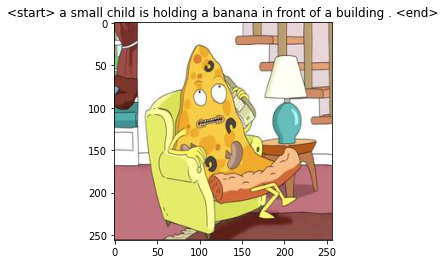

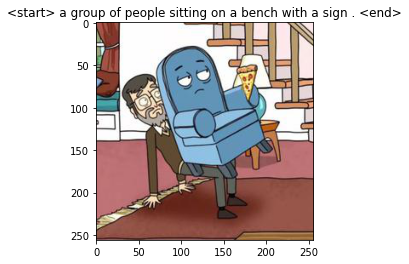

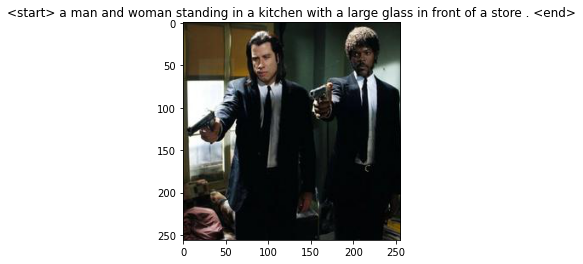

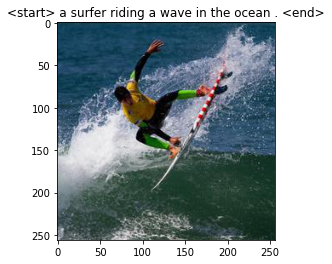

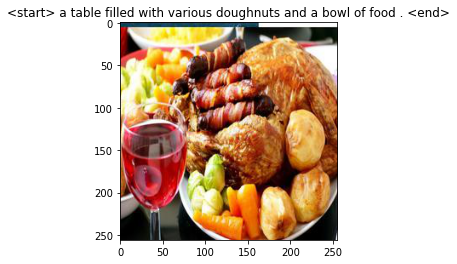

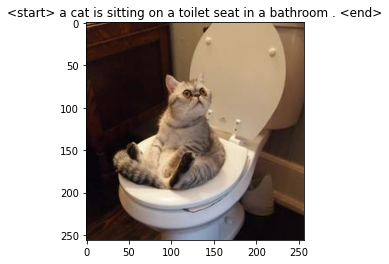

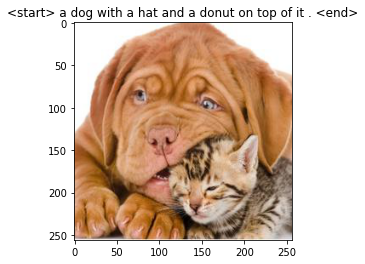

In [ ]:
for i,image_path in enumerate(['my_example.jpg', 'my_example2.jpg', 
                               'my_example3.jpg', 'my_example4.jpg',
                               'my_example5.jpg', 'my_example6.jpg',
                               'my_example7.jpg']):
    image_fullpath = '/content/drive/MyDrive/ML/COCO/my_examples_resized/' + image_path
    sentence = make_caption(image_fullpath, encoder, decoder)
    fig = plt.figure()
    ax = fig.add_subplot()
    ax.set_title(sentence)
    ax.imshow(np.asarray(Image.open(image_fullpath)))
    fig.show()

#Выводы

Графики потерь как на обучении, так и на тесте как и положено монотонно уменьшаются. Но модель обучается довольно долго. Кроме того, с бОльшим числом изображений для обучения результат скорее всего был бы лучше. 

Для отслеживания генерации аннотаций во время обучения, я выбрал достаточно трудные картинки. Тем не менее, заметно и явное улучшение качества аннотаций в процессе обучения. Модель неплохо улавливает общую тематику изображения и его действующих лиц. 

Модель хорошо работает и на моих примерах, которые имеют тематику похожую на выборку. Например, описание картинки с котом на туалете и серфера оказалось идеальным. Собаку и еду модель определила успешно. А вот другие изображения совсем не похожи на картинки из выборки, поэтому с ними модель не справилась. 